# Dataset Specifications

* 25 Million Rows
* 12 Features
 * Features are unknown for privacy reasons. Additionally, the are projected as to keep predictive power, while making it extremely difficult to deduce what they originally were.
* 2 binary labels
    * Visits
    * Conversions
* Global Treatment Ratio: 84.6%

In [2]:
%%bash
ls -al

total 228
drwxr-xr-x 4 root root   4096 Jan 29 20:23 .
drwxr-xr-x 5 root root   4096 Jan 28 23:07 ..
-rw-r--r-- 1 root root 208492 Jan 29 20:23 capstone.ipynb
drwxr-xr-x 8 root root   4096 Jan 28 23:05 .git
-rw-r--r-- 1 root root     25 Jan 28 23:05 .gitignore
drwxr-xr-x 2 root root   4096 Jan 28 23:08 .ipynb_checkpoints
-rw-r--r-- 1 root root     20 Jan 28 23:05 README.md


In [1]:
from google.datalab import Context

context = Context.default()
print('The current project is %s' % context.project_id)

The current project is capstone-project-229521


In [2]:
import google.datalab.bigquery as bq

query="""
SELECT COUNT(*) as total_rows
FROM `uplift.data`
"""

df = bq.Query(query).execute().result().to_dataframe()
df.head()

,total_rows
0,25309482


In [3]:
%%bq query --name uplift
SELECT
  *
FROM uplift.data

In [4]:
%bq sample -q uplift --count 10

f0,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,treatment,conversion,visit,exposure
1.95951489715,3.26364063587,8.32839973636,3.20761282735,3.50673313202,10.1612806506,-1.74702087447,-0.166689358471,-8.06121231628,13.1938689634,-1.86089994712,4.1576480474,1,0,0,0
-0.1243367538,3.26364063587,8.29390152588,3.20761282735,3.80315301212,10.1612806506,-0.786359586602,-0.166689358471,-21.3517694309,19.3397463853,-12.6056969613,4.1576480474,1,0,1,0
-0.456635750252,3.26364063587,8.74719263059,3.73587094245,3.50673313202,10.1612806506,-0.946780578383,-0.166689358471,-9.08408212593,11.7001869073,-1.86089994712,4.1576480474,0,0,0,0
-1.16324360649,3.26364063587,8.74616510001,3.73587094245,3.50673313202,10.1612806506,-3.10481841121,-0.166689358471,-15.9075568714,11.7001869073,-1.86089994712,4.1576480474,1,0,0,0
0.441358219137,3.26364063587,8.69170982092,3.20761282735,3.50673313202,10.1612806506,-1.91350821854,-0.166689358471,-13.4829812938,18.6470796943,-1.86089994712,4.1576480474,1,0,0,0
-0.328042608695,3.26364063587,9.12642248393,3.73587094245,3.50673313202,10.1612806506,-2.89190073043,-0.166689358471,-11.2876510529,9.85009345366,-1.86089994712,4.1576480474,0,0,0,0
1.49604494016,3.68150115738,8.43178050498,1.8583030771,3.50673313202,13.1631475853,-5.0879501593,-1.25345285899,-20.8960924608,20.800543582,-1.86089994712,4.1576480474,1,0,1,1
1.6096970821,3.26364063587,8.38091712172,2.64520731082,3.50673313202,10.840586284,-3.21701537496,-4.64624107593,-20.0836067426,22.2973750434,-1.86089994712,4.1576480474,1,0,1,1
1.07252787604,3.26364063587,8.33169517856,2.77342264119,4.17659789584,10.1612806506,-0.72874176153,-0.166689358471,-21.6390297343,21.1898398389,-5.56486176463,4.3152960948,1,0,1,0
1.98808922321,3.41786052152,8.28240316139,2.82213452936,3.50673313202,14.3244282359,-3.91690327032,-0.214644956298,-15.3402285373,16.3690123621,-1.86089994712,4.1576480474,0,0,0,0


In [5]:
upliftdata = uplift.execute(output_options=bq.QueryOutput.dataframe()).result()
upliftdata.head()

,f0,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,treatment,conversion,visit,exposure
0,-0.918450,3.263641,8.549610,3.735871,3.803153,10.161281,-1.525452,-0.166689,-9.084082,14.846159,-4.770560,4.249866,1,0,0,0
1,-1.824840,3.263641,9.319971,3.735871,3.506733,10.161281,-2.302969,-0.166689,-14.285729,9.850093,-1.860900,4.157648,1,0,0,0
2,0.073708,3.263641,8.335159,2.494348,3.803153,10.161281,-2.198736,-0.166689,-27.007546,25.271345,-12.375544,4.157648,1,0,1,0
3,-0.546492,3.263641,8.482258,3.735871,3.506733,10.161281,-1.419208,-0.166689,-8.061212,14.145877,-1.860900,4.157648,1,0,0,0
4,0.243772,3.263641,8.505971,3.581365,3.506733,10.161281,-0.668772,-0.166689,-11.976511,13.864657,-1.860900,4.157648,1,0,0,0


# Exploratory Data Analysis
Exploratory Data Analysis (EDA) is foundational to working with machine learning, and any other sort of analysis. EDA means getting to know your data, getting your fingers dirty with your data, feeling it and seeing it. The end result is you know your data very well, so when you build models you build them based on an actual, practical, physical understanding of the data, not assumptions or vaguely held notions. You can still make assumptions of course, but EDA means you will understand your assumptions and why you're making those assumptions. 

First, take a look at the data.

In [9]:
upliftdata.describe()

,f0,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,treatment,conversion,visit,exposure
count,2.530948e+07,2.530948e+07,2.530948e+07,2.530948e+07,2.530948e+07,2.530948e+07,2.530948e+07,2.530948e+07,2.530948e+07,2.530948e+07,2.530948e+07,2.530948e+07,2.530948e+07,2.530948e+07,2.530948e+07,2.530948e+07
mean,6.193441e-01,3.265647e+00,8.506897e+00,3.656395e+00,3.522577e+00,1.020163e+01,1.755059e+00,-2.934498e-01,-2.049940e+00,1.067117e+01,-2.092319e+00,4.159096e+00,8.458817e-01,2.294041e-03,4.132159e-02,3.493936e-02
std,1.534830e+00,2.293420e-02,3.589551e-01,2.415026e-01,1.090087e-01,2.322288e-01,1.673734e+00,6.648472e-01,5.466541e+00,2.294696e+00,1.382599e+00,1.700285e-02,3.610621e-01,4.784118e-02,1.990330e-01,1.836262e-01
min,-1.946282e+00,3.263641e+00,8.272483e+00,1.119173e+00,3.506733e+00,1.016128e+01,-8.958192e+00,-4.724865e+00,-3.350365e+01,9.850093e+00,-1.303824e+01,4.157648e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,-1.005456e+00,3.263641e+00,8.272483e+00,3.735871e+00,3.506733e+00,1.016128e+01,9.451627e-01,-1.666894e-01,-2.716012e+00,9.850093e+00,-1.860900e+00,4.157648e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,1.631905e+00,3.263641e+00,8.272483e+00,3.735871e+00,3.506733e+00,1.016128e+01,2.386066e+00,-1.666894e-01,1.107571e+00,9.850093e+00,-1.860900e+00,4.157648e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,1.991981e+00,3.263641e+00,8.756008e+00,3.735871e+00,3.506733e+00,1.016128e+01,2.981721e+00,-1.666894e-01,1.107571e+00,9.850093e+00,-1.860900e+00,4.157648e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
max,1.991981e+00,4.827224e+00,9.337056e+00,3.735871e+00,7.797549e+00,1.846414e+01,2.981721e+00,-1.666894e-01,1.107571e+00,3.198858e+01,-1.860900e+00,5.293435e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


You can see that the various indices operate on scales differing by orders of magnitude. It's best to scale the data so that, for example, operations involving multiple indices aren't unduly influenced by a single, massive index.


* ## Data overview

In [14]:
print "Rows :  " + str(upliftdata.shape[0])
print "Columns : " + str(upliftdata.shape[1])
print "\nFeatures : \n" + str(upliftdata.columns.tolist())
print "\nMissing values : " + str(upliftdata.isnull().sum().values.sum()) 
print "\nUnique values : \n" + str(upliftdata.nunique())

Rows :  25309482
Columns : 16

Features : 
[u'f0', u'f1', u'f2', u'f3', u'f4', u'f5', u'f6', u'f7', u'f8', u'f9', u'f10', u'f11', u'treatment', u'conversion', u'visit', u'exposure']

Missing values : 0

Unique values : 
f0            2273204
f1                 61
f2            2208889
f3                590
f4                264
f5                137
f6               1736
f7             796764
f8               3941
f9               1696
f10            651139
f11               137
treatment           2
conversion          2
visit               2
exposure            2
dtype: int64


## Visual Exploratory Data Analysis

* ### Pie Charts

Plot the pie charts for the treatment.

In [41]:
#Pie charts
import plotly.offline as py#visualization 
py.init_notebook_mode(connected=True)#visualization
import plotly.graph_objs as go#visualization
import plotly.tools as tls#visualization

lab = upliftdata["treatment"].value_counts().keys().tolist() #values
val = upliftdata["treatment"].value_counts().values.tolist()
trace = go.Pie(labels = lab ,
               values = val ,
               marker = dict(colors =  [ 'royalblue' ,'lime'], line = dict(color = "white", width = 1.3)),
               rotation = 90,
               hoverinfo = "label+value+text", 
               hole = .5 )
py.iplot([trace])

Plot the pie chart for visit.

In [42]:
lab = upliftdata["visit"].value_counts().keys().tolist() #values
val = upliftdata["visit"].value_counts().values.tolist()
trace = go.Pie(labels = lab ,
               values = val ,
               marker = dict(colors =  [ 'royalblue' ,'lime'], line = dict(color = "white", width = 1.3)),
               rotation = 90,
               hoverinfo = "label+value+text", 
               hole = .5 )
py.iplot([trace])

Plot the pie chart for conversion.

In [43]:
lab = upliftdata["conversion"].value_counts().keys().tolist() #values
val = upliftdata["conversion"].value_counts().values.tolist()
trace = go.Pie(labels = lab ,
               values = val ,
               marker = dict(colors =  [ 'royalblue' ,'lime'], line = dict(color = "white", width = 1.3)),
               rotation = 90,
               hoverinfo = "label+value+text", 
               hole = .5 )
py.iplot([trace])

* ### Box Plots

visualize basic statistics like outliers, min/max or quantiles

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [15, 5]

/usr/local/envs/py2env/lib/python2.7/site-packages/matplotlib/font_manager.py:1320: UserWarning:

findfont: Font family [u'sans-serif'] not found. Falling back to DejaVu Sans



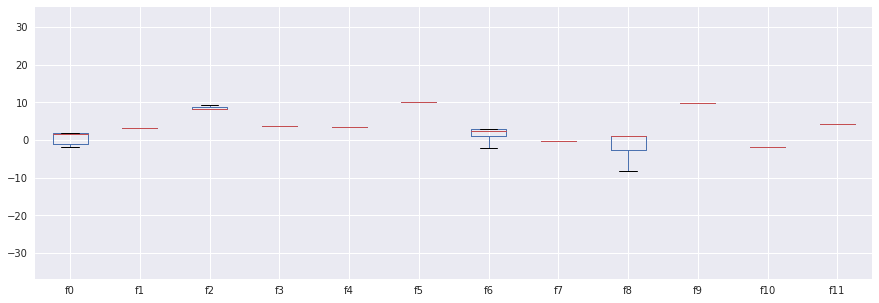

In [45]:
upliftdata.boxplot(column=['f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11'])

* ### Features Distributions

Take a look at the distributions for all 12 features for visit.

In [47]:
def plot_distribution_visit(data_select) : 
    sns.set_style("ticks")
    s = sns.FacetGrid(upliftdata, hue = 'visit',aspect = 2.5)
    s.map(sns.kdeplot, data_select, shade = True, alpha = 0.8)
    s.set(xlim=(0, upliftdata[data_select].max()))
    s.add_legend()
    s.set_axis_labels(data_select, 'proportion')
    s.fig.suptitle(data_select)
    plt.show()

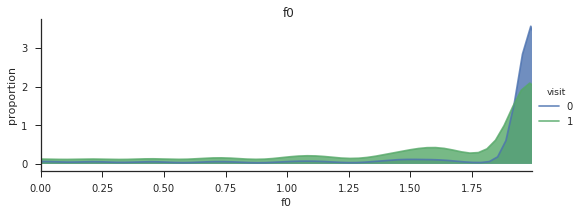

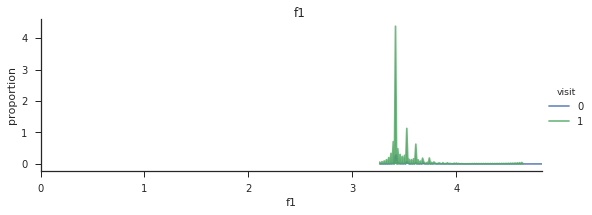

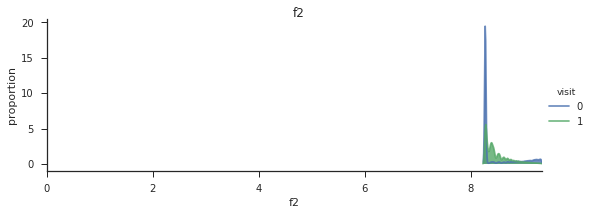

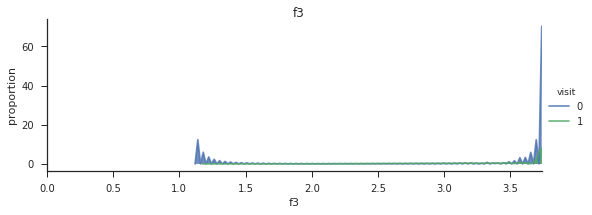

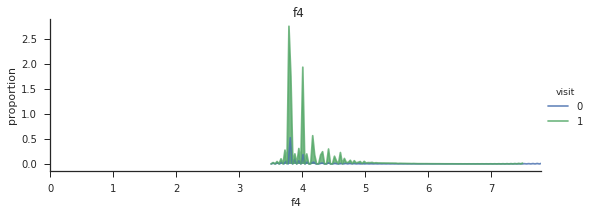

...

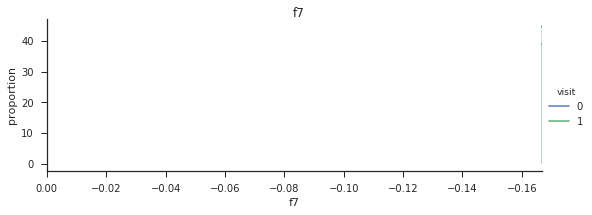

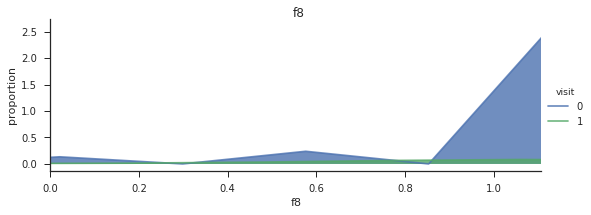

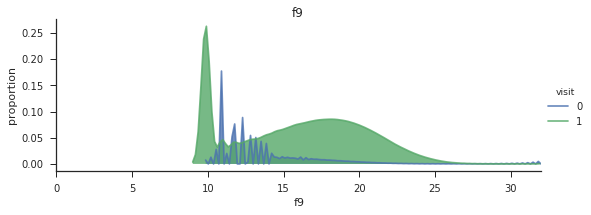

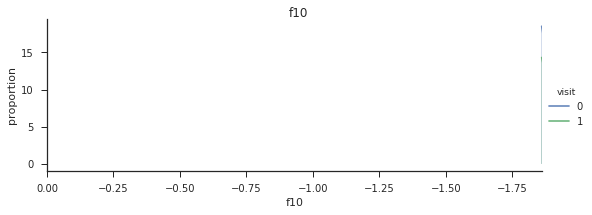

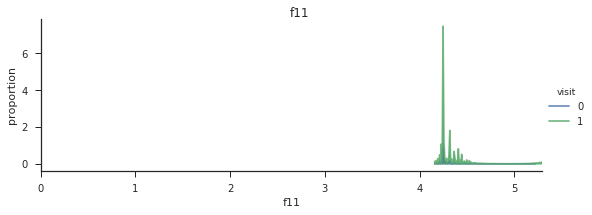

In [49]:
columns = ['f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11']
for x in columns:
  plot_distribution_visit(x)

Take a look at the distributions for all 12 features for conversion.

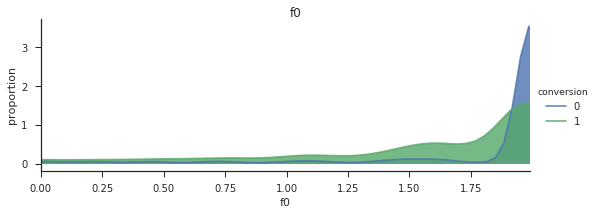

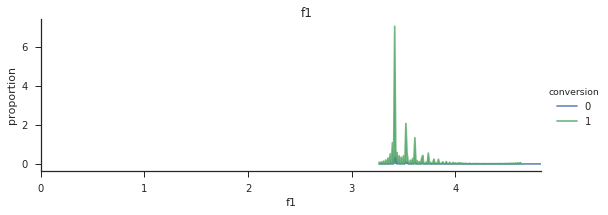

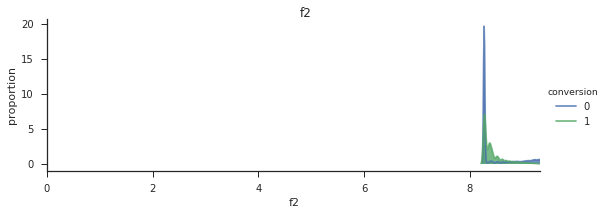

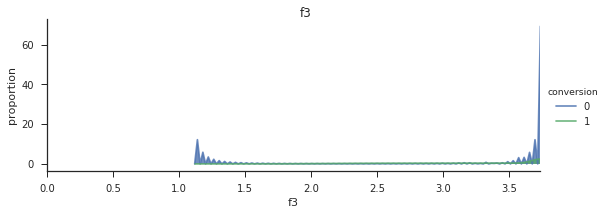

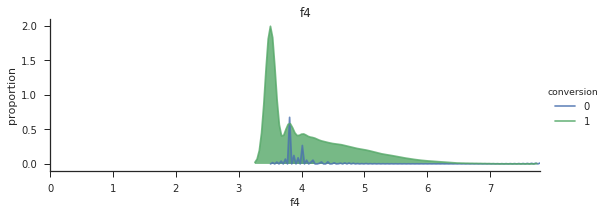

...

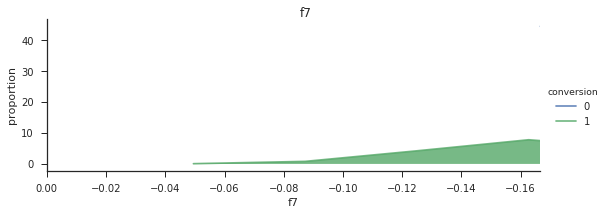

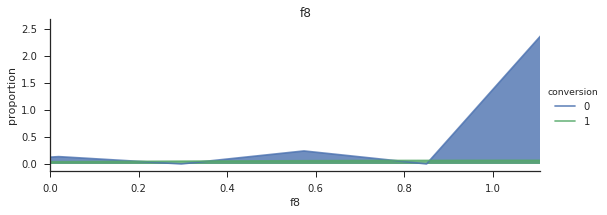

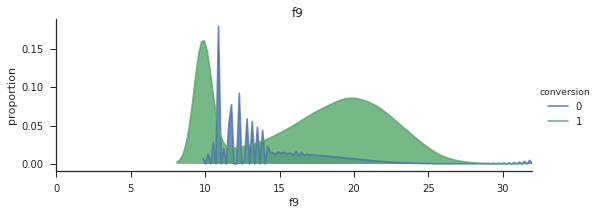

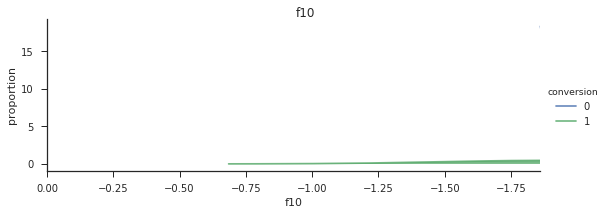

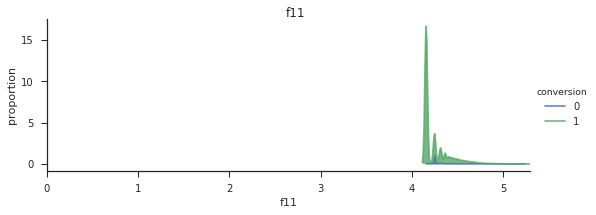

In [51]:
def plot_distribution_conversion(data_select) : 
    sns.set_style("ticks")
    s = sns.FacetGrid(upliftdata, hue = 'conversion',aspect = 2.5)
    s.map(sns.kdeplot, data_select, shade = True, alpha = 0.8)
    s.set(xlim=(0, upliftdata[data_select].max()))
    s.add_legend()
    s.set_axis_labels(data_select, 'proportion')
    s.fig.suptitle(data_select)
    plt.show()

for x in columns:
  plot_distribution_conversion(x)

* ### Scatterplots

I will not draw the scatterplots for the whole dataset because scatterplots is a very time-consuming procedure, and it won't run in such a large data set.
However, I will generate some pairplots for a sample of data randomly selected to fit the model. Scatterplot matrix will be plotted to observe the distribution of data from one feature to the other in the later sections.

* ### Pearson Correlation Heatmap

Let us generate some correlation plots of the features to see how related one feature is to the next. To do so, we will utilise the Seaborn plotting package which allows us to plot heatmaps very conveniently as follows

In [11]:
#correlation matrix
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

corrmat = upliftdata.corr()

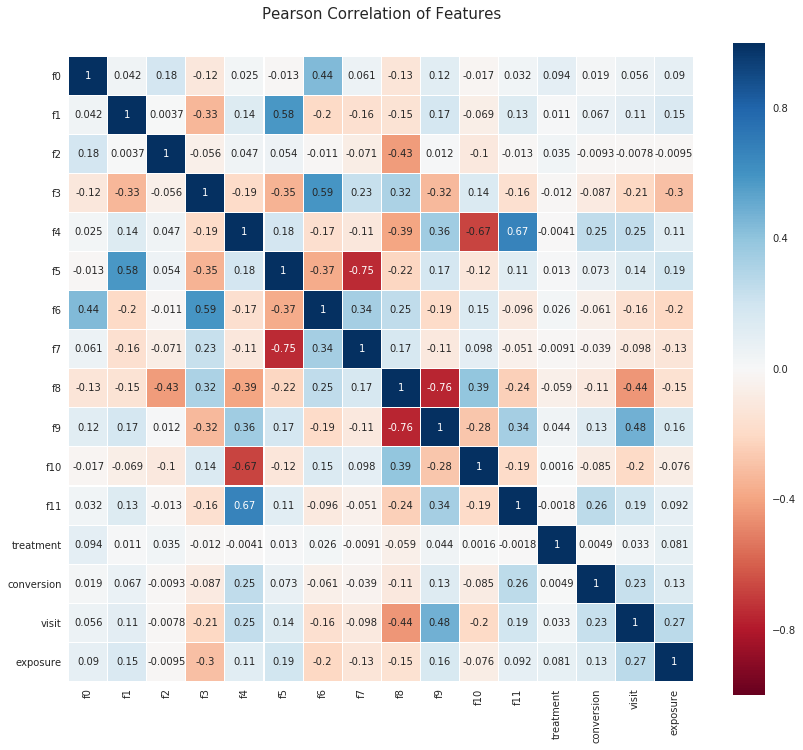

In [12]:
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(corrmat,linewidths=0.1,vmax=1.0, square=True, cmap=colormap, linecolor='white', annot=True)

* Takeaway from the Plots

One thing that that the Pearson Correlation plot can tell us is that there are not too many features strongly correlated with one another. This is good from a point of view of feeding these features into your learning model because this means that there isn't much redundant or superfluous data in our data set and we are happy that each feature carries with it some unique information.

## Sanity Check

As we know, this uplift dataset is preprocessed. There are three sanity check conducted for the data set, so this section will reimplement the sanity checks.

* ### Sanity Check 1

No users in the control population should be exposed to ads during the test. Note that a feeble 0.001% ratio of non-compliance to this assumption and chose to remove these users from the dataset by the researchers who provided the data set.

In [68]:
control = upliftdata[upliftdata['treatment'] == 0]
len(control[control['exposure'] == 1])

0

Clearly we see the first sanity check satisfied.

* ### Sanity Check 2

A second sanity check is that the treatment should be independent of the features: T ⊥ X . 
A convenient way to verify this assumption is to perform a Classifier 2 Sample Test (C2ST): a classifier trained to predict treatment should not do better than chance level. The distribution of H0 in this case is obtained by computing the test loss of classifiers trained to predict random splits in the data.

In [106]:
%%bq query --name samples
SELECT f0, f1, f2, f3, f4, f5, f6, f7, f8, f9, f10, f11, treatment, conversion 
FROM `uplift.data` 
ORDER BY RAND() 
LIMIT 200000

In [107]:
df = samples.execute().result().to_dataframe()
df.head()

,f0,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,treatment,conversion
0,-1.265276,3.263641,8.503921,3.735871,3.506733,10.161281,-0.246148,-0.166689,-9.261679,10.932329,-1.8609,4.157648,1,0
1,1.991981,3.263641,8.272483,3.735871,3.506733,10.161281,2.981721,-0.166689,1.107571,9.850093,-1.8609,4.157648,1,0
2,1.372047,3.263641,8.272483,3.471742,3.506733,10.161281,1.963442,-0.166689,1.107571,9.850093,-1.8609,4.157648,0,0
3,1.991981,3.263641,8.272483,3.735871,3.506733,10.161281,2.981721,-0.166689,1.107571,9.850093,-1.8609,4.157648,1,0
4,-0.791923,3.263641,8.272483,3.735871,3.506733,10.161281,-2.944846,-0.166689,1.107571,9.850093,-1.8609,4.157648,1,0


In [108]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.metrics import hamming_loss
from scipy import stats

In [109]:
clf = LogisticRegression()
# `loss` : sklearn compatible loss function (default: `hamming_loss`)
loss = hamming_loss
bootstraps = 300

X_train, X_test, y_train, y_test = train_test_split(df[['f0','f1','f2','f3','f4','f5','f6','f7','f8','f9','f10','f11']], 
                                                    df['treatment'], test_size=0.33, random_state=335)

In [110]:
y_pred = clf.fit(X_train, y_train).predict(X_test)
emp_loss = loss(y_test, y_pred)
bs_losses = []
y_bar = np.mean(df['treatment'])

for b in range(bootstraps+1):
    y_random = np.random.binomial(1, y_bar, size=df['treatment'].shape[0])
    X_train, X_test, y_train, y_test = train_test_split(df[['f0','f1','f2','f3','f4','f5','f6','f7','f8','f9','f10','f11']], y_random, test_size=0.33)
    y_pred_bs = clf.fit(X_train, y_train).predict(X_test)
    bs_losses += [loss(y_test, y_pred_bs)]
    
pc = stats.percentileofscore(sorted(bs_losses), emp_loss) / 100.
pvalue = pc if pc < y_bar else 1 - pc

In [111]:
print("Loss of classifier trained on treatment variable of full dataset: %s" % emp_loss)
print("Average loss of classifers trained on random treatment variable: %s" % (np.mean(bs_losses)))

Loss of classifier trained on treatment variable of full dataset: 0.1543939393939394
Average loss of classifers trained on random treatment variable: 0.15440607067351253


In [112]:
stats.ttest_1samp(bs_losses, emp_loss)

Ttest_1sampResult(statistic=0.1435994547456638, pvalue=0.8859131794335262)

Text(0.5,0,u'Hamming Loss')

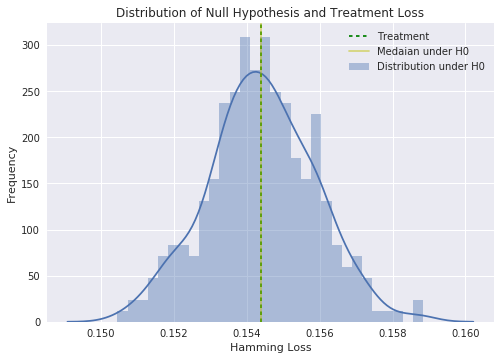

In [135]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.distplot(bs_losses, bins=30, label='Distribution under H0')
plt.axvline(emp_loss, color='g', dashes=[2, 2], label='Treatment')
# plt.text(emp_loss+.1,0,'Treatment loss',rotation=90)
plt.axvline(np.mean(bs_losses), color='y', alpha=0.5, label='Medaian under H0')
plt.legend()
plt.title("Distribution of Null Hypothesis and Treatment Loss")
plt.ylabel("Frequency")
plt.xlabel("Hamming Loss")

We can see our median random loss is 0.15441, treatment loss is 0.15439, and p-value is 0.886. Hence, we cannot reject the null hypothesis. That is to say, a classifier trained to predict treatment do not do better than chance level. Therefore, this sanity check is satisfied.

* ### Sanity Check 3

A third level of sanity check is to make sure that logged features are informative and relevant for predicting outcomes (visit and conversion).
The researchers said that this is not necessarily trivial as we sampled features that were technically easy to log and anonymized them. The performance (as measured by log-loss) of classifiers are learned on the outcomes for treatment, control and the whole dataset. The non-trivial improvement over a dummy baseline indicates that features are indeed informative for the task. We also measure positive, substantial mutual information of each individual feature and outcome but don’t provide detailed results to reduce clutter. Note that baseline is a classifier predicting the average outcome, and improvement is relative to baseline. Big improvements indicate that the features have predictive power.

In [136]:
print("Percent of dataset that has a conversion: %s" % (df['conversion'].sum() / 200000.))

Percent of dataset that has a conversion: 0.002395


In [163]:
from sklearn.metrics import log_loss

clf=LogisticRegression(class_weight="balanced")

# whole dataset
X_train, X_test, y_train, y_test = train_test_split(df[['f0','f1','f2','f3','f4','f5','f6','f7','f8','f9','f10','f11']], 
                                                    df['conversion'], test_size=0.33, random_state=35)

y_pred = clf.fit(X_train, y_train).predict(X_test)
conversion_loss = log_loss(y_test, y_pred)

# treatment
X_train, X_test, y_train, y_test = train_test_split(df[['f0','f1','f2','f3','f4','f5','f6','f7','f8','f9','f10','f11']][df.treatment == 1], 
                                                    df['conversion'][df.treatment == 1], test_size=0.33, random_state=35)

y_pred = clf.fit(X_train, y_train).predict(X_test)
treatmeant_loss = log_loss(y_test, y_pred)

# control
X_train, X_test, y_train, y_test = train_test_split(df[['f0','f1','f2','f3','f4','f5','f6','f7','f8','f9','f10','f11']][df.treatment == 0], 
                                                    df['conversion'][df.treatment == 0], test_size=0.33, random_state=35)

y_pred = clf.fit(X_train, y_train).predict(X_test)
control_loss = log_loss(y_test, y_pred)

In [164]:
# baseline
y_bar = np.mean(df['conversion'])
y_random = np.random.binomial(1, y_bar, size=df['conversion'].shape[0])
X_train, X_test, y_train, y_test = train_test_split(df[['f0','f1','f2','f3','f4','f5','f6','f7','f8','f9','f10','f11']], y_random)
y_pred_bs = clf.fit(X_train, y_train).predict(X_test)
baseline = log_loss(y_test, y_pred_bs)

In [167]:
def improvement(baseline, new):
  return (baseline - new) / baseline * 100 

print("Hamming Loss on Various Classifiers for Conversion")
print("Loss of whole dataset: %s" %  conversion_loss)
print("Loss of treatment: %s" %  treatmeant_loss)
print("Loss of control: %s" %  control_loss)
print("Loss of baseline: %s" %  baseline)
print("")
print("Log-loss Improvement over baseline")
print("Log-Loss impovement of whole dataset: %s" % improvement(baseline, conversion_loss))
print("Log-Loss impovement of treatment: %s" % improvement(baseline, treatmeant_loss))
print("Log-Loss impovement of control: %s" % improvement(baseline, control_loss))
print("Log-Loss impovement of baseline: %s" % improvement(baseline, baseline))

Hamming Loss on Various Classifiers for Conversion
Loss of whole dataset: 2.8374781491234367
Loss of treatment: 3.064518179057916
Loss of control: 2.7291277067778172
Loss of baseline: 11.322762362533812

Log-loss Improvement over baseline
Log-Loss impovement of whole dataset: 74.94005386430752
Log-Loss impovement of treatment: 72.93488919984595
Log-Loss impovement of control: 75.89697973518989
Log-Loss impovement of baseline: 0.0


We can see the log-loss improvement is remarkable. Big improvements indicate that the features have predictive power. Hence, the third sanity check is also satisfied.

### Visualising data with principal components

We can visualize the data with two major principal components for a sample set of data with 200,000 observations.

In [173]:
from sklearn.decomposition import PCA
import pandas as pd

pca = PCA(n_components = 2)

target_col = ['conversion']
treat_col = ['treatment']

X = df[[i for i in df.columns if i not in treat_col + target_col]]
Y = df[target_col]

In [175]:
principal_components = pca.fit_transform(X)
pca_data = pd.DataFrame(principal_components,columns = ["PC1","PC2"])
pca_data = pca_data.merge(Y,left_index=True,right_index=True,how="left")
pca_data["conversion"] = pca_data["conversion"].replace({1:"Conversion",0:"No Conversion"})

In [176]:
def pca_scatter(target,color) :
    tracer = go.Scatter(x = pca_data[pca_data["conversion"] == target]["PC1"] ,
                        y = pca_data[pca_data["conversion"] == target]["PC2"],
                        name = target,mode = "markers",
                        marker = dict(color = color,
                                      line = dict(width = .5),
                                      symbol =  "diamond-open")
                       )
    return tracer

trace1 = pca_scatter("Conversion",'red')
trace2 = pca_scatter("No Conversion",'royalblue')
py.iplot([trace2,trace1])

### Pairplots for the Samples

Finally let us generate some pairplots to observe the distribution of data from one feature to the other.

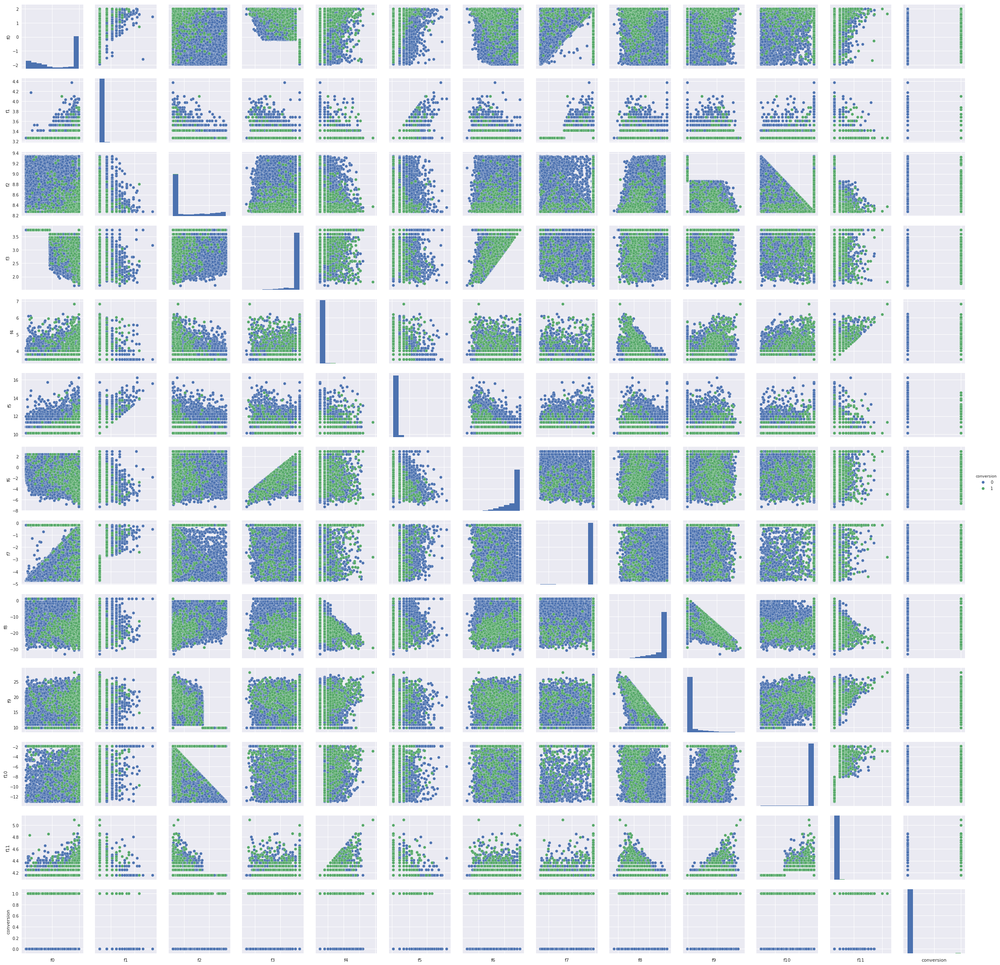

In [183]:
g = sns.pairplot(df[['f0','f1','f2','f3','f4','f5','f6','f7','f8','f9','f10','f11','conversion']], hue='conversion')
g.set(xticklabels=[])